In [2]:
import pyshtools as pysh
import matplotlib.pyplot as plt

from cartopy import crs as ccrs
import pygmt
from palettable import scientific as scm
from pyshtools import constants
import numpy as np

#from pyshtools.shio.shread import shread
from pyshtools.expand import MakeGridDH
from pyshtools.expand import SHExpandDH
from pyshtools.spectralanalysis import spectrum

In [3]:
pysh.utils.figstyle(rel_width=0.75)
%config InlineBackend.figure_format = 'retina' 

In [4]:
clm = pysh.datasets.Moon.GRGM1200B(lmax=660)

In [5]:
clm.info()

kind = 'real'
normalization = '4pi'
csphase = 1
lmax = 660
GM (m3 / s2) = 4902800122445.3
r0 (m) = 1738000.0
Omega (rad / s) = 2.6617072234847315e-06
error_kind = 'unspecified'
header = ['4.9028001224452998E+12', '1.7380000000000000E+06', '1200', '1200']
header2 = None
name = 'GRGM1200B'
epoch = None


In [61]:
#clm.set_omega(constants.Moon.omega.value)
pysh.constants.Moon.omega = None
a = constants.Moon.a_orbit.value
f = 0.0012 
u0 = 4902800122445.3/1738000.0
r = constants.Moon.r.value
#u0 = constants.Moon.mass.value

In [59]:
#pysh.constants.Moon.omega.value

In [60]:
pysh.constants.Moon.r


<<class 'astropy.constants.constant.Constant'> name='Mean radius of the Moon' value=1737151.0 uncertainty=0.0 unit='m' reference='LOLA2600p: Wieczorek, M. A. (2015). Gravity and topography of the terrestrial planets. In T. Spohn & G. Schubert (Eds.), Treatise on Geophysics, 2nd ed., Vol. 10, pp. 153-193). Oxford, Elsevier-Pergamon, doi:10.1016/B978-0-444-53802-4.00169-X.'>

In [7]:
print(pysh.constants.Moon.a_orbit)

  Name   = Semimajor axis of the orbit of the Moon
  Value  = 384399014.0
  Uncertainty  = 0.0
  Unit  = m
  Reference = Williams, J. G., D. H. Boggs, and W. M. Folkner (2013), DE430 lunar orbit, physical librations, and surface coordinates, IOM 335-JW,DB, WF-20130722-016, July 22, 2013, Jet Propul. Lab., Pasadena, Calif.


In [12]:
print(pysh.constants.Moon.mass)

  Name   = Mass of the Moon
  Value  = 7.3457891763930305e+22
  Uncertainty  = 1.6509136027104294e+18
  Unit  = kg
  Reference = Derived from gm_moon and G.


In [21]:
grav = clm.expand(lmax = 660) 
#fig, ax = grav.plot3d(show=False)

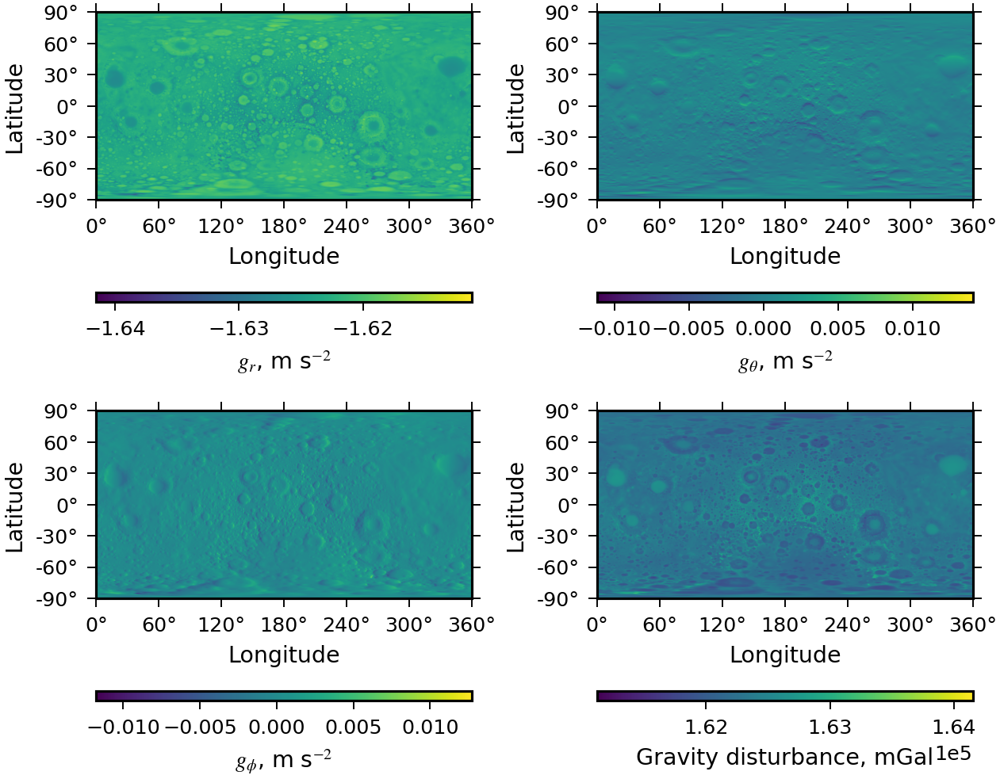

In [62]:
grav = clm.expand(lmax = 660) # not sure if to include a and f value 
fig1, ax1 = grav.plot(show=False)

The expand() method returns an SHGravGrid class instance.
This class stores each of the five grids, rad, theta, phi, total, and pot as SHGrid class 
instances. The four gravity grids can be plotted together using the method plot()

don't know if I need to mention 'a' (semi major axis) and 'f' (flattening) value for moon.Because moon surface is irregular for using flattening value. 


In [73]:
grav?

In [85]:
grav.to_xarray()

<xarray.Dataset>
Dimensions:    (lat: 1323, lon: 2645)
Coordinates:
  * lat        (lat) float64 90.0 89.86 89.73 89.59 ... -89.73 -89.86 -90.0
  * lon        (lon) float64 0.0 0.1362 0.2723 0.4085 ... 359.7 359.9 360.0
Data variables:
    radial     (lat, lon) float64 -1.623 -1.623 -1.623 ... -1.624 -1.624 -1.624
    theta      (lat, lon) float64 0.0 0.0 0.0 ... -1.508e-21 -1.508e-21
    phi        (lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    total      (lat, lon) float64 1.623 1.623 1.623 1.623 ... 1.624 1.624 1.624
    potential  (lat, lon) float64 2.82e+06 2.82e+06 ... 2.821e+06 2.821e+06
Attributes: (12/16)
    title:           
    description:     
    comment:         pyshtools grid
    nlat:            1323
    nlon:            2645
    lmax:            660
    ...              ...
    omega:           2.6617072234847315e-06
    lmax_calc:       660
    sampling:        2
    normal_gravity:  True
    n:               1322
    extend:          True

In [88]:
grav.to_xarray().lat

<xarray.DataArray 'lat' (lat: 1323)>
array([ 90.      ,  89.863843,  89.727685, ..., -89.727685, -89.863843,
       -90.      ])
Coordinates:
  * lat      (lat) float64 90.0 89.86 89.73 89.59 ... -89.59 -89.73 -89.86 -90.0
Attributes:
    long_name:     latitude
    units:         degrees_north
    actual_range:  [90.0, -90.0]

In [89]:
grav.to_xarray().lon

<xarray.DataArray 'lon' (lon: 2645)>
array([0.000000e+00, 1.361573e-01, 2.723147e-01, ..., 3.597277e+02,
       3.598638e+02, 3.600000e+02])
Coordinates:
  * lon      (lon) float64 0.0 0.1362 0.2723 0.4085 ... 359.6 359.7 359.9 360.0
Attributes:
    long_name:     longitude
    units:         degrees_east
    actual_range:  [0.0, 360.0]

In [86]:
grav.to_xarray().info

<bound method Dataset.info of <xarray.Dataset>
Dimensions:    (lat: 1323, lon: 2645)
Coordinates:
  * lat        (lat) float64 90.0 89.86 89.73 89.59 ... -89.73 -89.86 -90.0
  * lon        (lon) float64 0.0 0.1362 0.2723 0.4085 ... 359.7 359.9 360.0
Data variables:
    radial     (lat, lon) float64 -1.623 -1.623 -1.623 ... -1.624 -1.624 -1.624
    theta      (lat, lon) float64 0.0 0.0 0.0 ... -1.508e-21 -1.508e-21
    phi        (lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    total      (lat, lon) float64 1.623 1.623 1.623 1.623 ... 1.624 1.624 1.624
    potential  (lat, lon) float64 2.82e+06 2.82e+06 ... 2.821e+06 2.821e+06
Attributes: (12/16)
    title:           
    description:     
    comment:         pyshtools grid
    nlat:            1323
    nlon:            2645
    lmax:            660
    ...              ...
    omega:           2.6617072234847315e-06
    lmax_calc:       660
    sampling:        2
    normal_gravity:  True
    n:               1322
  

The geoid is computed using the geoid() method. 
By specifying the reference potential (in m2/s2), 
the height is calculted with respect to a sphere of reference radius r0.
This method returns an SHGeoid class instance,
where the geoid map is stored internally as an SHGrid class instance. 
Here, we compute the geoid on a grid that has a finer resolution than the potential 
coefficients by specifying the optional variable lmax. 
The reason for doing so is to compare this map directly 
to a higher resolution map of the shape of the planet later.

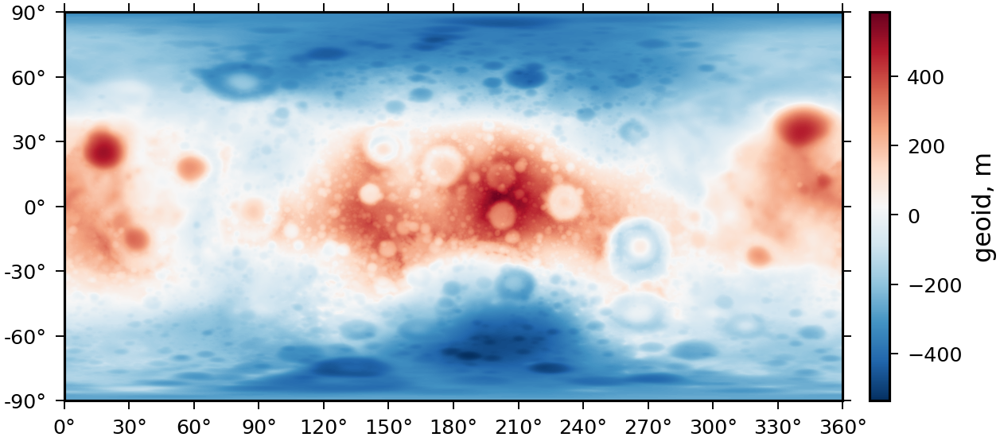

In [63]:
moon_geoid = clm.geoid(u0, lmax= 660)
fig2, ax2 = moon_geoid.plot(cmap='RdBu_r', show=False)

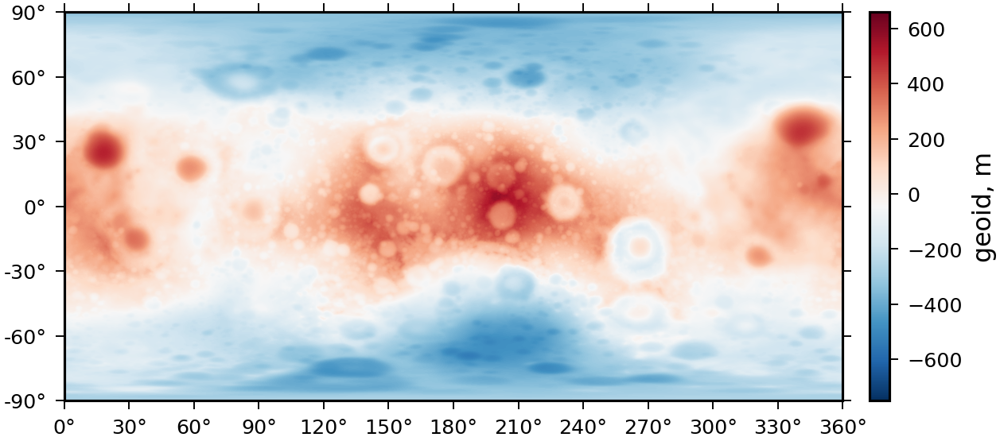

In [64]:
moon_geoid_ellipsoid = clm.geoid(u0,lmax = 660)
fig3, ax3 = moon_geoid_ellipsoid.plot(cmap='RdBu_r', cmap_limits=[-750, 660], show=False)

In [79]:
moon_geoid.to_xarray()

<xarray.DataArray (latitude: 1323, longitude: 2645)>
array([[-327.04690127, -327.04690127, -327.04690127, ..., -327.04690127,
        -327.04690127, -327.04690127],
       [-326.53343156, -326.53480097, -326.53617719, ..., -326.53071324,
        -326.53206897, -326.53343156],
       [-326.6144469 , -326.61742538, -326.62041683, ..., -326.60852909,
        -326.61148145, -326.6144469 ],
       ...,
       [-264.0931337 , -264.0885505 , -264.08395953, ..., -264.10227607,
        -264.09770895, -264.0931337 ],
       [-262.79314776, -262.7931878 , -262.79323036, ..., -262.79307505,
        -262.7931102 , -262.79314776],
       [-262.79866378, -262.79866378, -262.79866378, ..., -262.79866378,
        -262.79866378, -262.79866378]])
Coordinates:
  * latitude   (latitude) float64 90.0 89.86 89.73 89.59 ... -89.73 -89.86 -90.0
  * longitude  (longitude) float64 0.0 0.1362 0.2723 ... 359.7 359.9 360.0
Attributes: (12/21)
    actual_range:  [-535.848710374441, 585.6059783082455]
    title:         
    comment:       pyshtools grid
    long_name:     Geoid
    units:         m
    nlat:          1323
    ...            ...
    r:             1738000.0
    order:         2
    lmax_calc:     660
    sampling:      2
    n:             1322
    extend:        True

here, latitude and longitude are given but cannot figure out how should i extract the height.

In [102]:
lat_long_geoid = moon_geoid.to_xarray()

#lat_long_geoid.to_file()


In [101]:
#moon_geoid.to_xarray()

/home/dipika/anaconda3/envs/project1/lib/python3.8/site-packages/pyshtools/shclasses/shgrid.py:1272: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


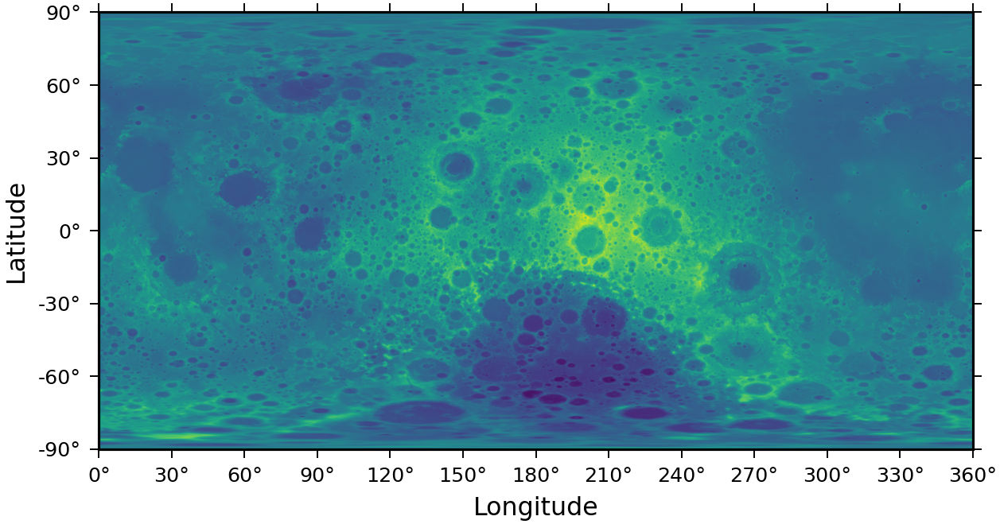

In [34]:
shape = pysh.datasets.Moon.MoonTopo2600p(lmax=660)  # read only the first 719 degrees from the file.
shape_grid = shape.expand(grid='DH2')
fig2, ax2 = shape_grid.plot()

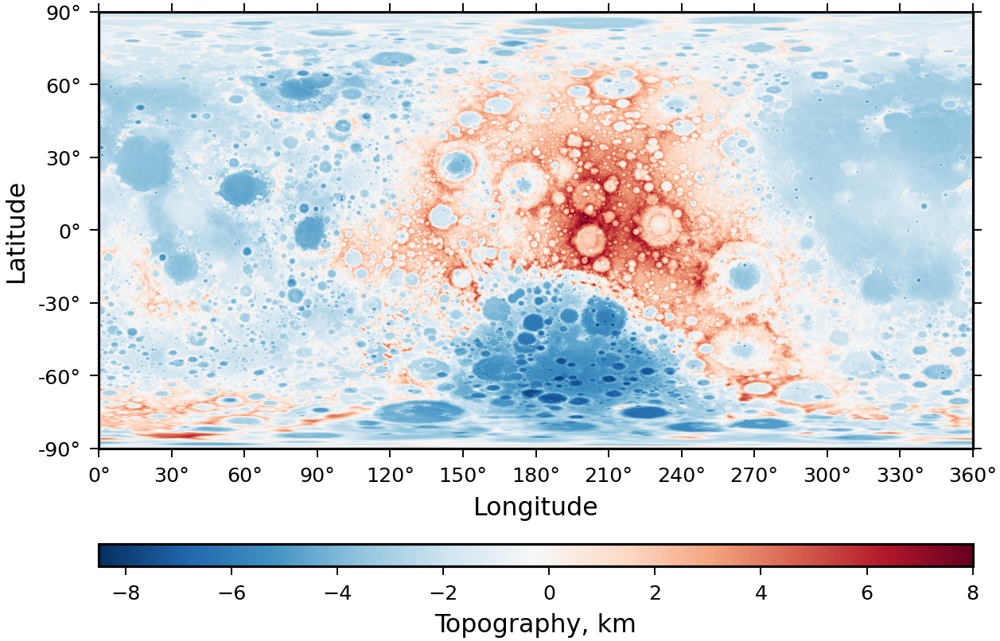

In [35]:
topo_grid = (shape_grid - moon_geoid.a - moon_geoid.geoid) / 1.e3
fig6, ax6 = topo_grid.plot(colorbar='bottom',
                           cb_label='Topography, km',
                           cmap='RdBu_r',
                           cmap_limits=[-8.5, 8.],
                           show=False)

In [24]:
bc = pysh.SHGravCoeffs.from_shape(shape,
                                  rho=2800.,
                                  gm=clm.gm,
                                  lmax=660)


In [25]:
bc.info()

kind = 'real'
normalization = '4pi'
csphase = 1
lmax = 660
GM (m3 / s2) = 4902800122445.3
r0 (m) = 1737151.1982650787
Omega (rad / s) = None
error_kind = None
header = None
header2 = None
name = None
epoch = None


In [34]:
bc = bc.change_ref(r0=clm.r0)
bouguer = clm - bc
bouguer_grid = bouguer.expand(lmax=660)

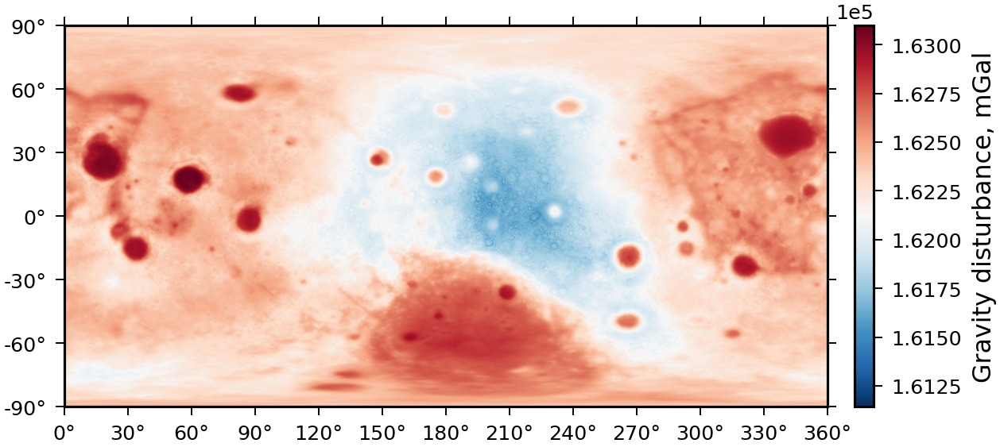

In [35]:
fig5, ax5 = bouguer_grid.plot_total(cmap='RdBu_r', show=False)


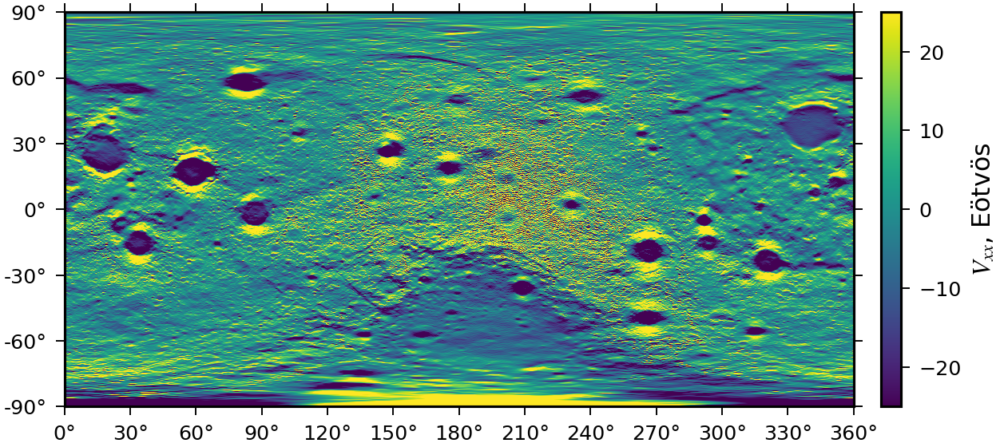

In [39]:
tensor = bouguer.tensor(lmax=660)
fig8, ax8 = tensor.plot_vxx(cmap_limits=[-25, 25], show=False)


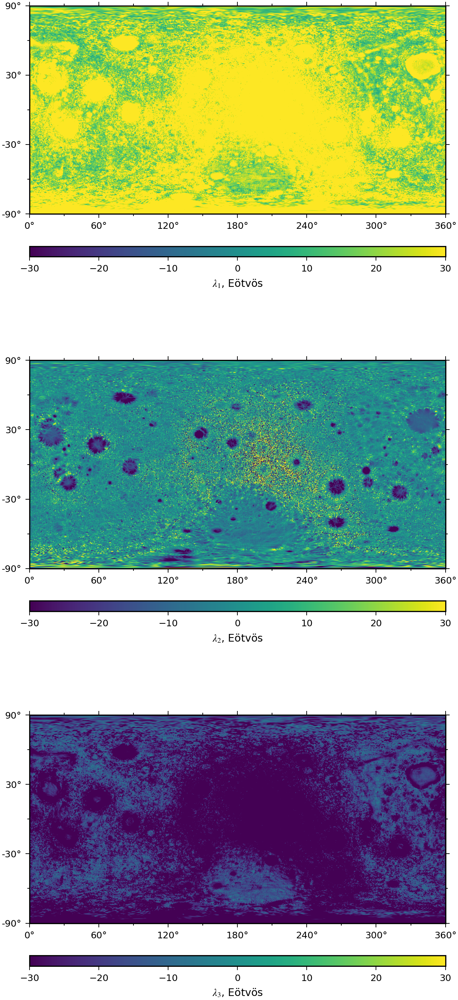

In [41]:
fig9, ax9 = tensor.plot_eigs(cmap_limits=[-30, 30], show=False)

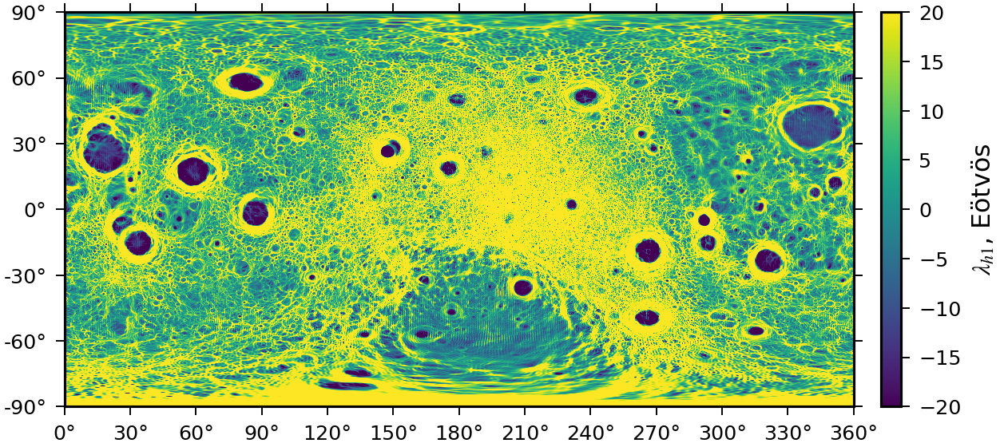

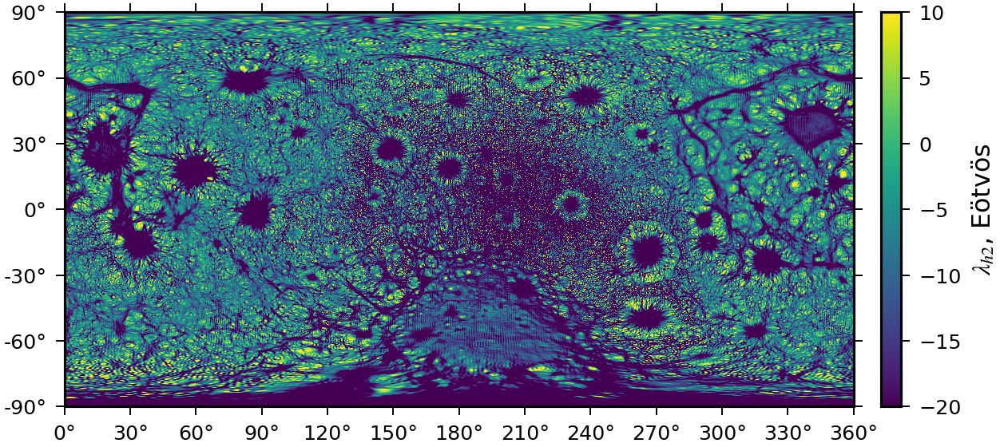

In [47]:
fig10, ax10 = tensor.plot_eigh1(cmap_limits=[-20, 20], show=False)
fig11, ax11 = tensor.plot_eigh2(cmap_limits=[-20, 10], show=False)

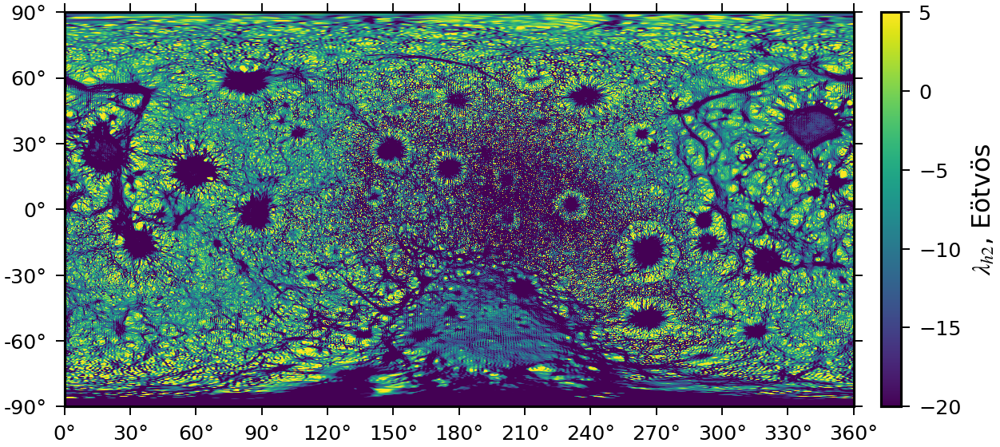

In [48]:
fig11, ax11 = tensor.plot_eigh2(cmap_limits=[-20, 5], show=False)

In [ ]:
coeffs_filtered2 = coeffs.copy()
lmin, lmax = 8, 20
coeffs_filtered2[:, :lmin, :] = 0.
coeffs_filtered2[:, lmax:, :] = 0.